# Loading the data

In [1]:
%pip install imblearn plotly

Note: you may need to restart the kernel to use updated packages.


In [2]:
# Set up Plotly express for visualization
%pip install plotly

import plotly.express as px

px.defaults.template = 'plotly_white'
px.defaults.color_continuous_scale = px.colors.sequential.Plasma
px.defaults.color_discrete_sequence = px.colors.qualitative.Vivid

Note: you may need to restart the kernel to use updated packages.


In [3]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the data
url = "https://raw.githubusercontent.com/franklin-univ-data-science/data/master/credit_default.csv"
df = pd.read_csv(url, index_col=0)

In [4]:
df.rename(columns={'X1' : 'Credit Amount', 
                   'X2' : 'Gender', 
                   'X3' : 'Education', 
                   'X4' : 'Marital Status', 
                   'X5' : 'Age', 
                   'X6' : 'Repay Delay Sep',
                   'X7' : 'Repay Delay Aug',
                   'X8' : 'Repay Delay Jul',
                   'X9' : 'Repay Delay Jun',
                   'X10': 'Repay Delay May',
                   'X11': 'Repay Delay Apr',
                   'X12': 'Bill Sep',
                   'X13': 'Bill Aug',
                   'X14': 'Bill Jul',
                   'X15': 'Bill Jun',
                   'X16': 'Bill May',
                   'X17': 'Bill Apr',
                   'X18': 'Prior Pay Sep',
                   'X19': 'Prior Pay Aug',
                   'X20': 'Prior Pay Jul',
                   'X21': 'Prior Pay Jun',
                   'X22': 'Prior Pay May',
                   'X23': 'Prior Pay Apr',  
                   'Y'  : 'Defaulted'
                   }, 
          inplace=True)
df.head()

,Credit Amount,Gender,Education,Marital Status,Age,Repay Delay Sep,Repay Delay Aug,Repay Delay Jul,Repay Delay Jun,Repay Delay May,...,Bill Jun,Bill May,Bill Apr,Prior Pay Sep,Prior Pay Aug,Prior Pay Jul,Prior Pay Jun,Prior Pay May,Prior Pay Apr,Defaulted
ID,,,,,,,,,,,,,,,,,,,,,
1,20000,2,2,1,24,2,2,-1,-1,-2,...,0,0,0,0,689,0,0,0,0,1
2,120000,2,2,2,26,-1,2,0,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
3,90000,2,2,2,34,0,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
4,50000,2,2,1,37,0,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
5,50000,1,2,1,57,-1,0,-1,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [5]:
# Convert the results of df.info to a dataframe
df_info = pd.DataFrame(df.dtypes, columns=['Data Type'])

# Add number of missing values to df_info
df_info['Missing Values'] = df.isnull().sum()

df_info

,Data Type,Missing Values
Credit Amount,int64,0
Gender,int64,0
Education,int64,0
Marital Status,int64,0
Age,int64,0
Repay Delay Sep,int64,0
Repay Delay Aug,int64,0
Repay Delay Jul,int64,0
Repay Delay Jun,int64,0
Repay Delay May,int64,0


In [6]:
df.describe()

,Credit Amount,Gender,Education,Marital Status,Age,Repay Delay Sep,Repay Delay Aug,Repay Delay Jul,Repay Delay Jun,Repay Delay May,...,Bill Jun,Bill May,Bill Apr,Prior Pay Sep,Prior Pay Aug,Prior Pay Jul,Prior Pay Jun,Prior Pay May,Prior Pay Apr,Defaulted
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,-0.266200,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,1.133187,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


# Data Exploration

<module 'matplotlib.pyplot' from 'c:\\Users\\Admin\\anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

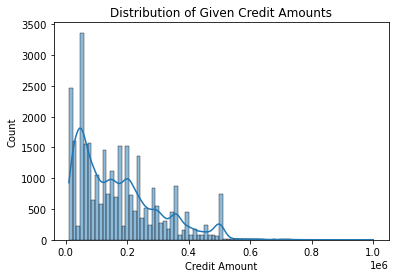

In [7]:
sns.histplot(data=df, x='Credit Amount', kde=True)
plt.title('Distribution of Given Credit Amounts')
plt

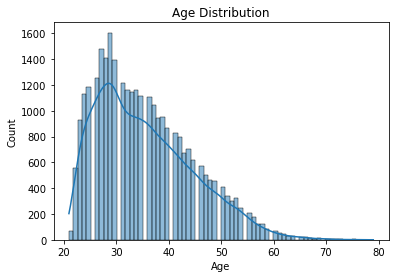

In [8]:
sns.histplot(data=df, x='Age', kde=True)
plt.title('Age Distribution')
plt.show()

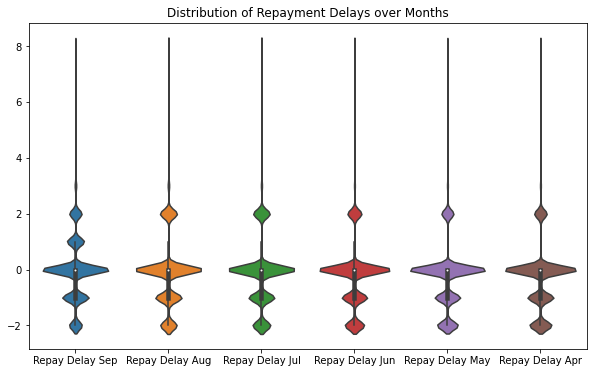

In [9]:
payment_cols = ['Repay Delay Sep', 'Repay Delay Aug', 'Repay Delay Jul', 'Repay Delay Jun', 'Repay Delay May', 'Repay Delay Apr']
plt.figure(figsize=(10,6))
sns.violinplot(data=df[payment_cols])
plt.title('Distribution of Repayment Delays over Months')
plt.show()

In [10]:
df.columns

Index(['Credit Amount', 'Gender', 'Education', 'Marital Status', 'Age',
       'Repay Delay Sep', 'Repay Delay Aug', 'Repay Delay Jul',
       'Repay Delay Jun', 'Repay Delay May', 'Repay Delay Apr', 'Bill Sep',
       'Bill Aug', 'Bill Jul', 'Bill Jun', 'Bill May', 'Bill Apr',
       'Prior Pay Sep', 'Prior Pay Aug', 'Prior Pay Jul', 'Prior Pay Jun',
       'Prior Pay May', 'Prior Pay Apr', 'Defaulted'],
      dtype='object')

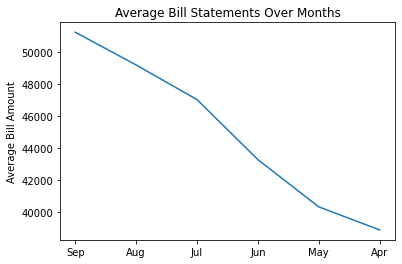

In [11]:

bill_cols = ['Bill Sep', 'Bill Aug', 'Bill Jul', 'Bill Jun', 'Bill May', 'Bill Apr']
df[bill_cols].mean().plot()
plt.title('Average Bill Statements Over Months')
plt.ylabel('Average Bill Amount')
plt.xticks(range(0, 6), ['Sep', 'Aug', 'Jul', 'Jun', 'May', 'Apr'])
plt.show()

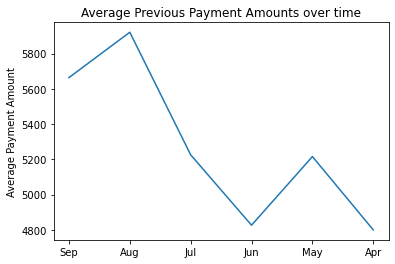

<Figure size 1440x1440 with 0 Axes>

In [12]:
payment_amount_cols = ['Prior Pay Sep', 'Prior Pay Aug', 'Prior Pay Jul', 'Prior Pay Jun', 'Prior Pay Apr', 'Prior Pay May']
df[payment_amount_cols].mean().plot()
plt.title('Average Previous Payment Amounts over time')
plt.xticks(range(0, 6), ['Sep', 'Aug', 'Jul', 'Jun', 'May', 'Apr'])
plt.ylabel('Average Payment Amount')
# Make the plot larger
plt.figure(figsize=(20,20))

# Set the X labels

plt.show()

# Data Preprocessing

In [13]:
# Map defaulted values of 1 to True and 0 to False
df['Defaulted'] = df['Defaulted'].eq(1)
df['Defaulted'].value_counts()

False    23364
True      6636
Name: Defaulted, dtype: int64

In [14]:
# Map education values of 1 to "Graduate School", 2 to "University", 3 to "High School", and everything else to "Other"
def map_education(education):
    if education == 1:
        return 'Graduate School'
    elif education == 2:
        return 'University'
    elif education == 3:
        return 'High School'
    else:
        return 'Other Education'
    
df['Education'] = df['Education'].apply(map_education)
df['Education'].value_counts()

University         14030
Graduate School    10585
High School         4917
Other Education      468
Name: Education, dtype: int64

In [15]:
# Plot a histogram of Education
px.histogram(df, x='Education', color='Defaulted', title='Education Distribution')

In [16]:
df = pd.get_dummies(df, columns=['Education'], prefix='', prefix_sep='')

In [17]:
# Map marital status values of 1 to "Married", 2 to "Single", and everything else to "Other"
def map_marital_status(status):
    if status == 1:
        return 'Married'
    elif status == 2:
        return 'Single'
    else:
        return 'Other Marital Status'
    
df['Marital Status'] = df['Marital Status'].apply(map_marital_status)
df['Marital Status'].value_counts()

Single                  15964
Married                 13659
Other Marital Status      377
Name: Marital Status, dtype: int64

In [18]:
# Plot a histogram of Marital Status
px.histogram(df, x='Marital Status', color='Defaulted', title='Marital Status Distribution')

In [19]:
df['Is Married'] = df['Marital Status'].eq('Married')
df.drop(columns=['Marital Status'], inplace=True)
df['Is Married'].value_counts()

False    16341
True     13659
Name: Is Married, dtype: int64

In [20]:
df['Gender'] = df['Gender'].eq(1)
df.rename(columns={'Gender': 'Is Male'}, inplace=True)
df['Is Male'].value_counts()

False    18112
True     11888
Name: Is Male, dtype: int64

In [21]:
# Set a Gender column into a new dataframe based on df. Use Male or Non-Male based on Is Male
df_gender = df.copy()

# Set gender to Male when df['Is Male'] is true, otherwise to Non-Male
df_gender['Gender'] = df['Is Male'].map({True: 'Male', False: 'Non-Male'})


# Plot a histogram of Is Male
px.histogram(df_gender, x='Gender', color='Defaulted', title='Gender Distribution')

# Set x-axis labels to Non-Male and Male


In [22]:
df.columns

Index(['Credit Amount', 'Is Male', 'Age', 'Repay Delay Sep', 'Repay Delay Aug',
       'Repay Delay Jul', 'Repay Delay Jun', 'Repay Delay May',
       'Repay Delay Apr', 'Bill Sep', 'Bill Aug', 'Bill Jul', 'Bill Jun',
       'Bill May', 'Bill Apr', 'Prior Pay Sep', 'Prior Pay Aug',
       'Prior Pay Jul', 'Prior Pay Jun', 'Prior Pay May', 'Prior Pay Apr',
       'Defaulted', 'Graduate School', 'High School', 'Other Education',
       'University', 'Is Married'],
      dtype='object')

In [23]:
# Add interaction term to address potential feature interaction
df['PriorPay_Sep_Aug_ratio'] = df['Prior Pay Sep'] / (df['Prior Pay Aug'] + 1e-10)
df['PriorPay_Sep_Jul_ratio'] = df['Prior Pay Sep'] / (df['Prior Pay Jul'] + 1e-10)
df['PriorPay_Sep_Jun_ratio'] = df['Prior Pay Sep'] / (df['Prior Pay Jun'] + 1e-10)
df['PriorPay_Sep_May_ratio'] = df['Prior Pay Sep'] / (df['Prior Pay May'] + 1e-10)
df['PriorPay_Sep_Apr_ratio'] = df['Prior Pay Sep'] / (df['Prior Pay Apr'] + 1e-10)

df['PriorPay_Aug_Jul_ratio'] = df['Prior Pay Aug'] / (df['Prior Pay Jul'] + 1e-10)
df['PriorPay_Aug_Jun_ratio'] = df['Prior Pay Aug'] / (df['Prior Pay Jun'] + 1e-10)
df['PriorPay_Aug_Apr_ratio'] = df['Prior Pay Aug'] / (df['Prior Pay Apr'] + 1e-10)
df['PriorPay_Aug_May_ratio'] = df['Prior Pay Aug'] / (df['Prior Pay May'] + 1e-10)

df['PriorPay_Jul_Jun_ratio'] = df['Prior Pay Jul'] / (df['Prior Pay Jul'] + 1e-10)
df['PriorPay_Jul_Apr_ratio'] = df['Prior Pay Jul'] / (df['Prior Pay Jun'] + 1e-10)
df['PriorPay_Jul_May_ratio'] = df['Prior Pay Jul'] / (df['Prior Pay Apr'] + 1e-10)

df['PriorPay_Jun_Apr_ratio'] = df['Prior Pay Jun'] / (df['Prior Pay Apr'] + 1e-10)
df['PriorPay_Jun_May_ratio'] = df['Prior Pay Jun'] / (df['Prior Pay May'] + 1e-10)

df['PriorPay_Apr_May_ratio'] = df['Prior Pay Apr'] / (df['Prior Pay May'] + 1e-10)

df.columns

Index(['Credit Amount', 'Is Male', 'Age', 'Repay Delay Sep', 'Repay Delay Aug',
       'Repay Delay Jul', 'Repay Delay Jun', 'Repay Delay May',
       'Repay Delay Apr', 'Bill Sep', 'Bill Aug', 'Bill Jul', 'Bill Jun',
       'Bill May', 'Bill Apr', 'Prior Pay Sep', 'Prior Pay Aug',
       'Prior Pay Jul', 'Prior Pay Jun', 'Prior Pay May', 'Prior Pay Apr',
       'Defaulted', 'Graduate School', 'High School', 'Other Education',
       'University', 'Is Married', 'PriorPay_Sep_Aug_ratio',
       'PriorPay_Sep_Jul_ratio', 'PriorPay_Sep_Jun_ratio',
       'PriorPay_Sep_May_ratio', 'PriorPay_Sep_Apr_ratio',
       'PriorPay_Aug_Jul_ratio', 'PriorPay_Aug_Jun_ratio',
       'PriorPay_Aug_Apr_ratio', 'PriorPay_Aug_May_ratio',
       'PriorPay_Jul_Jun_ratio', 'PriorPay_Jul_Apr_ratio',
       'PriorPay_Jul_May_ratio', 'PriorPay_Jun_Apr_ratio',
       'PriorPay_Jun_May_ratio', 'PriorPay_Apr_May_ratio'],
      dtype='object')

In [24]:
df['Prior Pay Total'] = df[["Prior Pay Sep", "Prior Pay Aug", "Prior Pay Jul", "Prior Pay Jun", "Prior Pay May", "Prior Pay Apr"]].sum(axis=1)
df["Total Pay Delay"] = df[["Repay Delay Sep", "Repay Delay Aug", "Repay Delay Jul", "Repay Delay Jun", "Repay Delay May", "Repay Delay Apr"]].sum(axis=1)
df["Average Pay Delay"] = df[["Repay Delay Sep", "Repay Delay Aug", "Repay Delay Jul", "Repay Delay Jun", "Repay Delay May", "Repay Delay Apr"]].mean(axis=1)
df['Bill Total'] = df[["Bill Sep", "Bill Aug", "Bill Jul", "Bill Jun", "Bill May", "Bill Apr"]].sum(axis=1)
df['Balance Total'] = df['Bill Total'] - df['Prior Pay Total']

df = df[df['Credit Amount'] <= 2500000]
df = df[df['Prior Pay Total'] <= 100000]
df = df[df['Total Pay Delay'] <= 5]

In [25]:
%pip install seaborn

import seaborn as sns
import numpy as np

def plot_correlation(corr, x_size=25, y_size=18):
    """ Displays a diagonalized heatmap from a correlation matrix using seaborn. """

    # This is a nice diverging palette that shows positive and negative correlations easily
    cmap = sns.color_palette("seismic", as_cmap=True)

    # Create a mask to cut off the top-right of the triangle
    mask = np.zeros_like(corr, dtype=bool)
    mask[np.triu_indices_from(mask)] = True
    mask[np.diag_indices_from(mask)] = False # Show the 1.00 self-correlation diagonal line. It looks a little empty without it
    
    # Create the heatmap
    fig = sns.heatmap(corr, mask=mask, cmap=cmap, center=0, linewidths=.5, annot=True, fmt='.2f', vmin=-1, vmax=1, xticklabels=True, yticklabels=True)   
    fig.set_xticklabels(fig.get_xticklabels(), rotation=45, horizontalalignment='right')
    fig.set_yticklabels(fig.get_yticklabels(), rotation=0, horizontalalignment='right')
    fig.axes.set_title('Feature Correlation')
    fig.figure.set_size_inches(x_size, y_size)

Note: you may need to restart the kernel to use updated packages.


In [26]:
df.columns

Index(['Credit Amount', 'Is Male', 'Age', 'Repay Delay Sep', 'Repay Delay Aug',
       'Repay Delay Jul', 'Repay Delay Jun', 'Repay Delay May',
       'Repay Delay Apr', 'Bill Sep', 'Bill Aug', 'Bill Jul', 'Bill Jun',
       'Bill May', 'Bill Apr', 'Prior Pay Sep', 'Prior Pay Aug',
       'Prior Pay Jul', 'Prior Pay Jun', 'Prior Pay May', 'Prior Pay Apr',
       'Defaulted', 'Graduate School', 'High School', 'Other Education',
       'University', 'Is Married', 'PriorPay_Sep_Aug_ratio',
       'PriorPay_Sep_Jul_ratio', 'PriorPay_Sep_Jun_ratio',
       'PriorPay_Sep_May_ratio', 'PriorPay_Sep_Apr_ratio',
       'PriorPay_Aug_Jul_ratio', 'PriorPay_Aug_Jun_ratio',
       'PriorPay_Aug_Apr_ratio', 'PriorPay_Aug_May_ratio',
       'PriorPay_Jul_Jun_ratio', 'PriorPay_Jul_Apr_ratio',
       'PriorPay_Jul_May_ratio', 'PriorPay_Jun_Apr_ratio',
       'PriorPay_Jun_May_ratio', 'PriorPay_Apr_May_ratio', 'Prior Pay Total',
       'Total Pay Delay', 'Average Pay Delay', 'Bill Total', 'Balance Total'

In [27]:
from sklearn.decomposition import PCA

# Apply PCA to reduce multicollinearity among features
pca = PCA(n_components=3)

# Scale the data before applying PCA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df.drop(columns=['Defaulted']))

principal_components = pca.fit_transform(df_scaled)
print(f"Explained variance by each component: {pca.explained_variance_ratio_}")  # Check explained variance
pca

Explained variance by each component: [0.22406081 0.10370727 0.07398213]


PCA(n_components=3)

In [28]:
# Plot the explained variances on a bar chart
fig = px.bar(x=['PC1', 'PC2', 'PC3'], y=pca.explained_variance_ratio_, title='Explained Variance by Principal Component', color=pca.explained_variance_ratio_, color_continuous_scale=px.colors.sequential.Plasma, range_color=[0, 1])
fig.update_layout(yaxis_title='Explained Variance', xaxis_title='Principal Component')
# Set the Y axis range to 0 to 1
fig.update_yaxes(range=[0, 1])
# Set the color legend to range from 0 to 1 and have a name of "Explained Variance"
# Set the color legend to have a max value of 1 and a min value of 0
fig.update_coloraxes(colorbar_title='Explained Variance')

fig.show()

In [29]:

# Add PCA components to data and remove original features
principal_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3'])
df_pca = pd.concat([df, principal_df], axis=1)
df_pca.head()

,Credit Amount,Is Male,Age,Repay Delay Sep,Repay Delay Aug,Repay Delay Jul,Repay Delay Jun,Repay Delay May,Repay Delay Apr,Bill Sep,...,PriorPay_Jun_May_ratio,PriorPay_Apr_May_ratio,Prior Pay Total,Total Pay Delay,Average Pay Delay,Bill Total,Balance Total,PC1,PC2,PC3
1,20000.0,False,24.0,2.0,2.0,-1.0,-1.0,-2.0,-2.0,3913.0,...,0.000000e+00,0.000000e+00,689.0,-2.0,-0.333333,7704.0,7015.0,0.042501,-3.802940,0.664452
2,120000.0,False,26.0,-1.0,2.0,0.0,0.0,0.0,2.0,2682.0,...,1.000000e+13,2.000000e+13,5000.0,3.0,0.500000,17077.0,12077.0,-0.241509,-2.266791,-0.005149
3,90000.0,False,34.0,0.0,0.0,0.0,0.0,0.0,0.0,29239.0,...,1.000000e+00,5.000000e+00,11018.0,0.0,0.000000,101653.0,90635.0,0.507810,-1.940601,-0.182625
4,50000.0,False,37.0,0.0,0.0,0.0,0.0,0.0,0.0,46990.0,...,1.028999e+00,9.354537e-01,8388.0,0.0,0.000000,231334.0,222946.0,0.336759,0.296045,0.747100
5,50000.0,True,57.0,-1.0,0.0,-1.0,0.0,0.0,0.0,8617.0,...,1.306241e+01,9.854862e-01,59049.0,-2.0,-0.333333,109339.0,50290.0,0.404432,-1.631982,-0.132062


In [30]:
df_pca['Defaulted'].unique()

array([True, False, nan], dtype=object)

In [31]:
# Remove NA rows from df_pca
df_pca.dropna(inplace=True)

In [32]:
# Create the 3D scatter plot
fig = px.scatter_3d(df_pca, 
                    x='PC1', 
                    y='PC2', 
                    z='PC3',
                    color='Defaulted',
                    opacity=0.5,
                    hover_data=['Credit Amount', 'Age', 'Defaulted'],)
# Set the height to something larger
fig.update_layout(height=800)
fig.show()

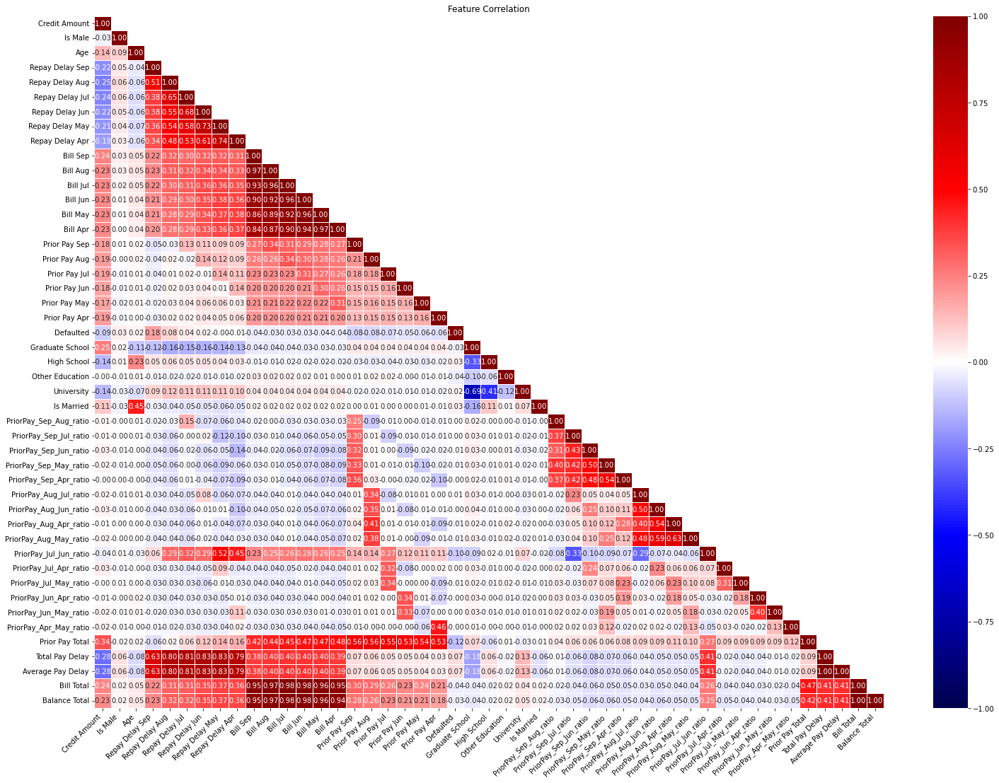

In [33]:
plot_correlation(df.corr())

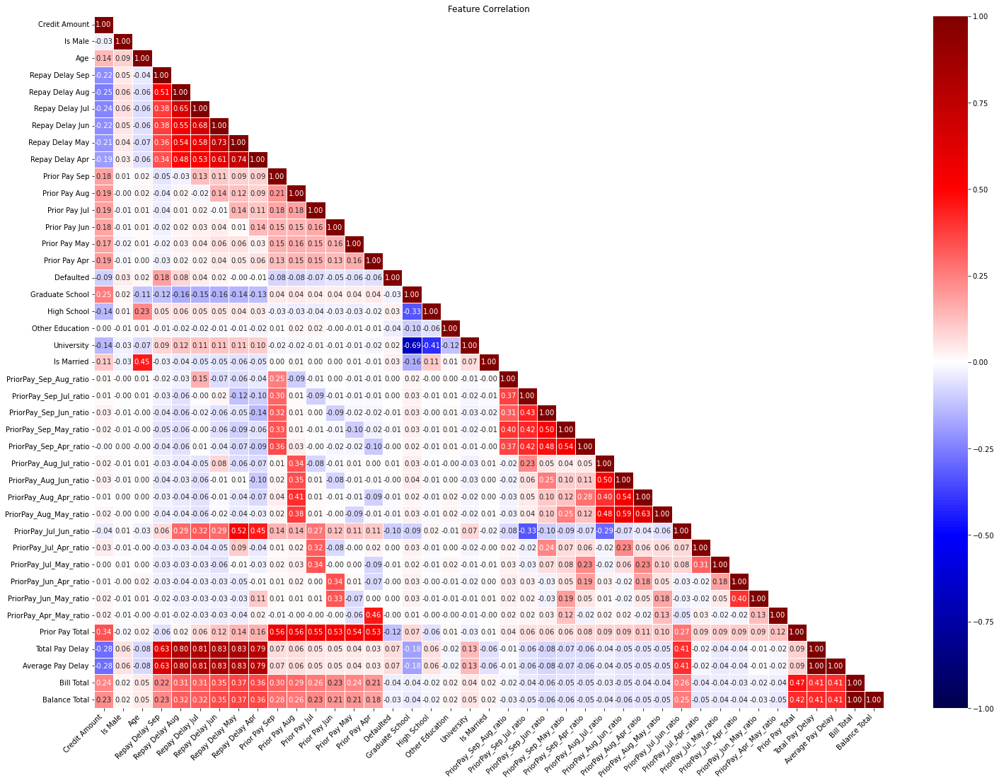

In [34]:
df_pruned = df.drop(columns=['Bill Sep', 'Bill Aug', 'Bill Jul', 'Bill Jun', 'Bill May', 'Bill Apr'])

plot_correlation(df_pruned.corr())

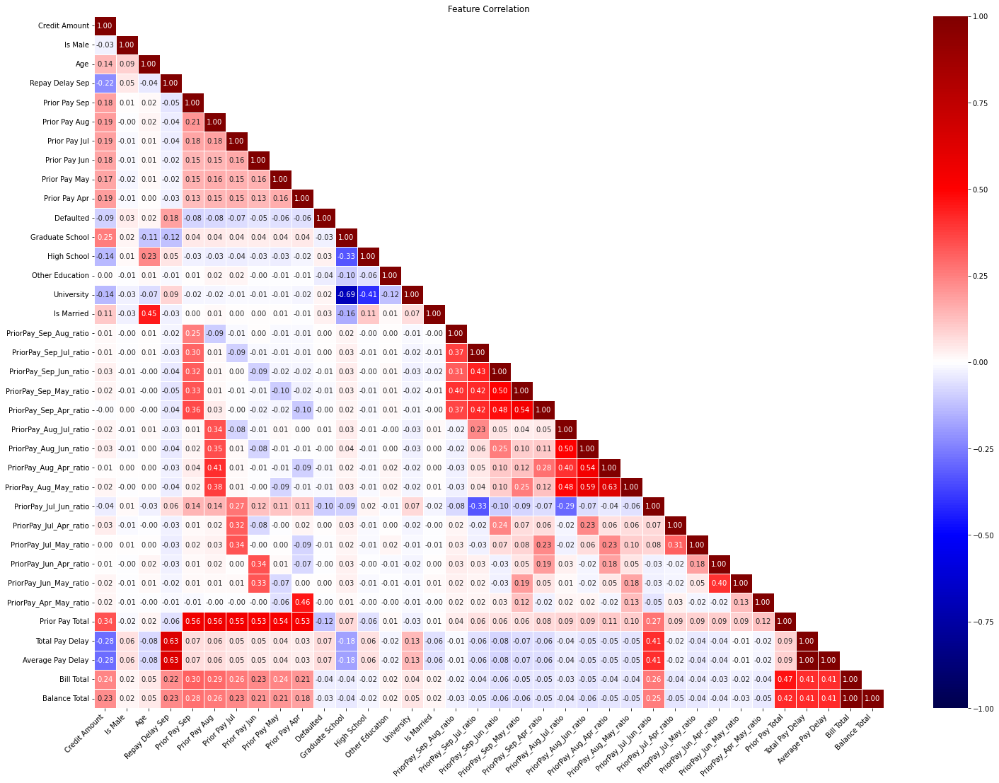

In [35]:
df_pruned = df_pruned.drop(columns=['Repay Delay Aug', 'Repay Delay Jul', 'Repay Delay Jun', 'Repay Delay May', 'Repay Delay Apr'])

plot_correlation(df_pruned.corr())

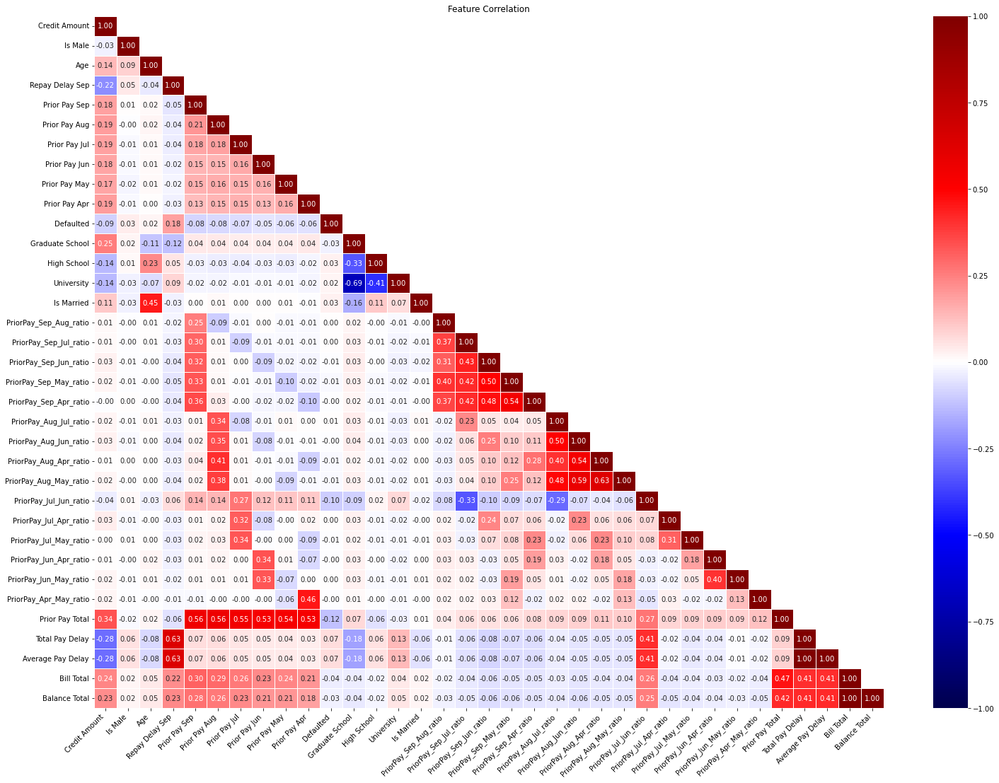

In [36]:
df_pruned = df_pruned.drop(columns=['Other Education'])

plot_correlation(df_pruned.corr())

In [37]:
# Plot a histogram of Defaulted
px.histogram(df, x='Defaulted', color='Defaulted', title='Target Class Distribution')

In [38]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE

X = df_pruned.drop(columns=['Defaulted'])
y = df_pruned['Defaulted']

# Applying SMOTE to address class imbalance in the training data 
# NOTE: This should have happened AFTER the train/test split
smote = SMOTE(random_state=123)
X, y = smote.fit_resample(X, y)

In [39]:
# Recombine X and y into a single dataframe
df_smote = pd.concat([X, y], axis=1)

In [40]:
# Plot a histogram of Defaulted
px.histogram(df_smote, x='Defaulted', color='Defaulted', title='Target Class Distribution')

In [41]:
# Add a stratification column
df_smote['Age Group'] = df_smote['Age'] // 10
df_smote['Stratify'] = 'Defaulted_' + df_smote['Defaulted'].astype(str) + '_Male_' + df_smote['Is Male'].astype(str) + '_Age_' + df_smote['Age Group'].astype(str)

# Plot Stratisfied value counts as a bar chart
fig = px.bar(df_smote['Stratify'].value_counts().head(10), title='Stratified Target Class Distribution', color=df_smote['Stratify'].value_counts().head(10), color_continuous_scale=px.colors.sequential.Plasma)
fig.update_coloraxes(colorbar_title='Count')
fig.update_layout(yaxis_title='Count', xaxis_title='Stratified Group')
fig.show()

In [42]:
X = df_smote.drop(columns=['Defaulted', 'Age Group', 'Stratify', 'Age', 'Is Male'])
y = df_smote['Defaulted']

# Splitting data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123, stratify=df_smote['Stratify'])

# Data Modeling

In [43]:
from sklearn.ensemble import RandomForestClassifier

# Create a pipeline with a standard scalar and the random forest classifier
from sklearn.pipeline import Pipeline

num_cores = 8

# Initialize the classifier with the best parameters
forest = RandomForestClassifier(
    bootstrap=False,
    max_depth=6,
    max_features='sqrt',
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=150,
    random_state=123,
    n_jobs=num_cores
)

model = Pipeline([
    ('scaler', StandardScaler()), # Not really needed with a Random Forest
    ('model', forest)
])

# Train the classifier on the resampled training data
model.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 RandomForestClassifier(bootstrap=False, max_depth=6,
                                        max_features='sqrt', n_estimators=150,
                                        n_jobs=8, random_state=123))])

# Data Evaluation

In [44]:
# List the various classification metrics for the model
from sklearn.metrics import classification_report, f1_score

# Get the predictions for the test data
y_pred = model.predict(X_test)

# Print the classification report
print(classification_report(y_test, y_pred, target_names=['Not Defaulted', 'Defaulted']))

# print the F1 score to 4 decimal places
print(f"F1 Score: {round(f1_score(y_test, y_pred), 4)}")

               precision    recall  f1-score   support

Not Defaulted       0.77      0.80      0.78      4091
    Defaulted       0.79      0.76      0.77      4092

     accuracy                           0.78      8183
    macro avg       0.78      0.78      0.78      8183
 weighted avg       0.78      0.78      0.78      8183

F1 Score: 0.7745


<AxesSubplot:title={'center':'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

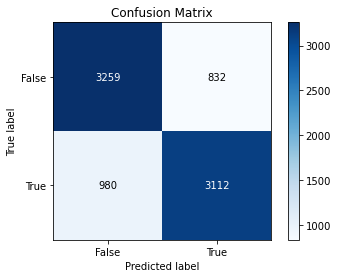

In [45]:
import scikitplot as skplt

skplt.metrics.plot_confusion_matrix(y_test, y_pred, normalize=False)

<AxesSubplot:title={'center':'Precision-Recall Curve'}, xlabel='Recall', ylabel='Precision'>

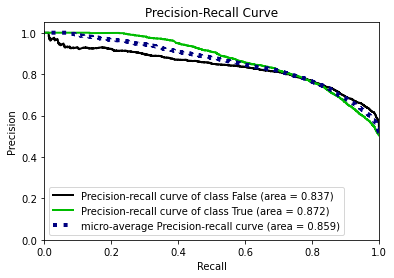

In [46]:
skplt.metrics.plot_precision_recall(y_test, model.predict_proba(X_test))

<AxesSubplot:title={'center':'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

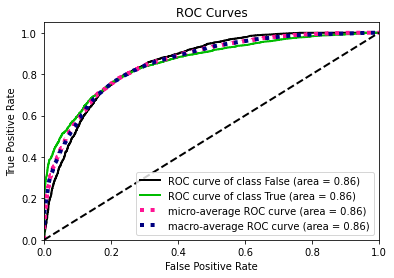

In [47]:
skplt.metrics.plot_roc(y_test, model.predict_proba(X_test))

<AxesSubplot:title={'center':'Cumulative Gains Curve'}, xlabel='Percentage of sample', ylabel='Gain'>

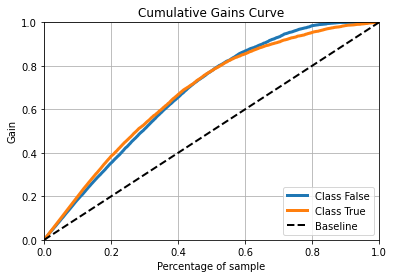

In [48]:
skplt.metrics.plot_cumulative_gain(y_test, model.predict_proba(X_test))

<AxesSubplot:title={'center':'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

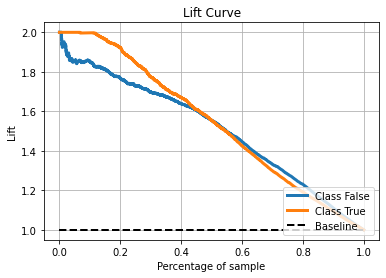

In [49]:
skplt.metrics.plot_lift_curve(y_test, model.predict_proba(X_test))

<AxesSubplot:title={'center':'Calibration plots (Reliability Curves)'}, xlabel='Mean predicted value', ylabel='Fraction of positives'>

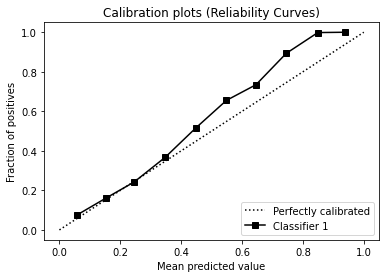

In [50]:
skplt.metrics.plot_calibration_curve(y_test, [model.predict_proba(X_test)])

<AxesSubplot:title={'center':'Learning Curve'}, xlabel='Training examples', ylabel='Score'>

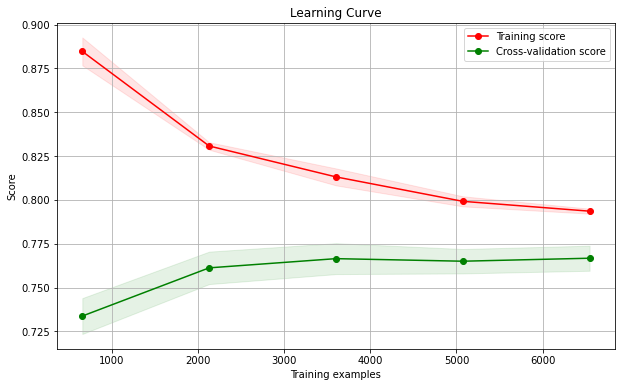

In [51]:
skplt.estimators.plot_learning_curve(model, X_test, y_test, figsize=(10, 6), n_jobs=num_cores, random_state=123)

In [52]:
# Cross validate the model
from sklearn.model_selection import cross_validate

# Cross validate the model
cv_results = cross_validate(model, X, y, cv=10, scoring=['accuracy', 'precision', 'recall', 'f1', 'roc_auc'], n_jobs=num_cores)

# Print the results
print(f"Accuracy: {cv_results['test_accuracy'].mean():.4f}")
print(f"Precision: {cv_results['test_precision'].mean():.4f}")
print(f"Recall: {cv_results['test_recall'].mean():.4f}")
print(f"F1: {cv_results['test_f1'].mean():.4f}")
print(f"AUC: {cv_results['test_roc_auc'].mean():.4f}")

Accuracy: 0.7671
Precision: 0.7783
Recall: 0.7381
F1: 0.7532
AUC: 0.8464


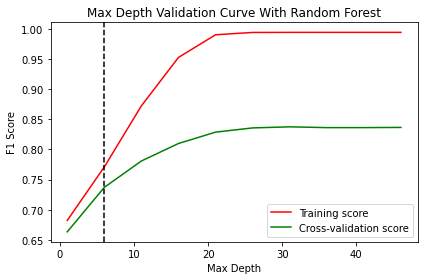

In [53]:
# Plot training and test scores based on the max_depth parameter
from sklearn.model_selection import validation_curve

# Create range of values for parameter
param_range = np.arange(1, 50, 5)

# Calculate accuracy on training and test set using range of parameter values
train_scores, test_scores = validation_curve(model, 
                                             X, 
                                             y, 
                                             param_name="model__max_depth", 
                                             param_range=param_range,
                                             scoring="f1", 
                                             n_jobs=num_cores)

# Calculate mean and standard deviation for training set scores
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)

# Calculate mean and standard deviation for test set scores
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Plot mean accuracy scores for training and test sets
plt.plot(param_range, train_mean, label="Training score", color="red")
plt.plot(param_range, test_mean, label="Cross-validation score", color="green")

# Add a vertical marker at 8
plt.axvline(x=6, color='black', linestyle='--')

# Create plot
plt.title("Max Depth Validation Curve With Random Forest")
plt.xlabel("Max Depth")
plt.ylabel("F1 Score")
plt.tight_layout()
plt.legend(loc="best")
plt.show()

In [54]:

# Feature Importance Visualization
importances = forest.feature_importances_
indices = np.argsort(importances)[::-1]

# Plot the feature importances as a bar chart in plotly
fig = px.bar(x=X_train.columns[indices], y=importances[indices], title='Feature Importance', color=importances[indices], color_continuous_scale=px.colors.sequential.Sunsetdark, range_color=[0, 1])
fig.update_layout(height=500, yaxis_title='Importance', xaxis_title='Feature')
# Set the y axis range to 0 to 1
fig.update_yaxes(range=[0, 0.25])
# Set the color legend to range from 0 to 1 and have a name of "Importance"
fig.update_coloraxes(colorbar_title='Importance')
fig.show()

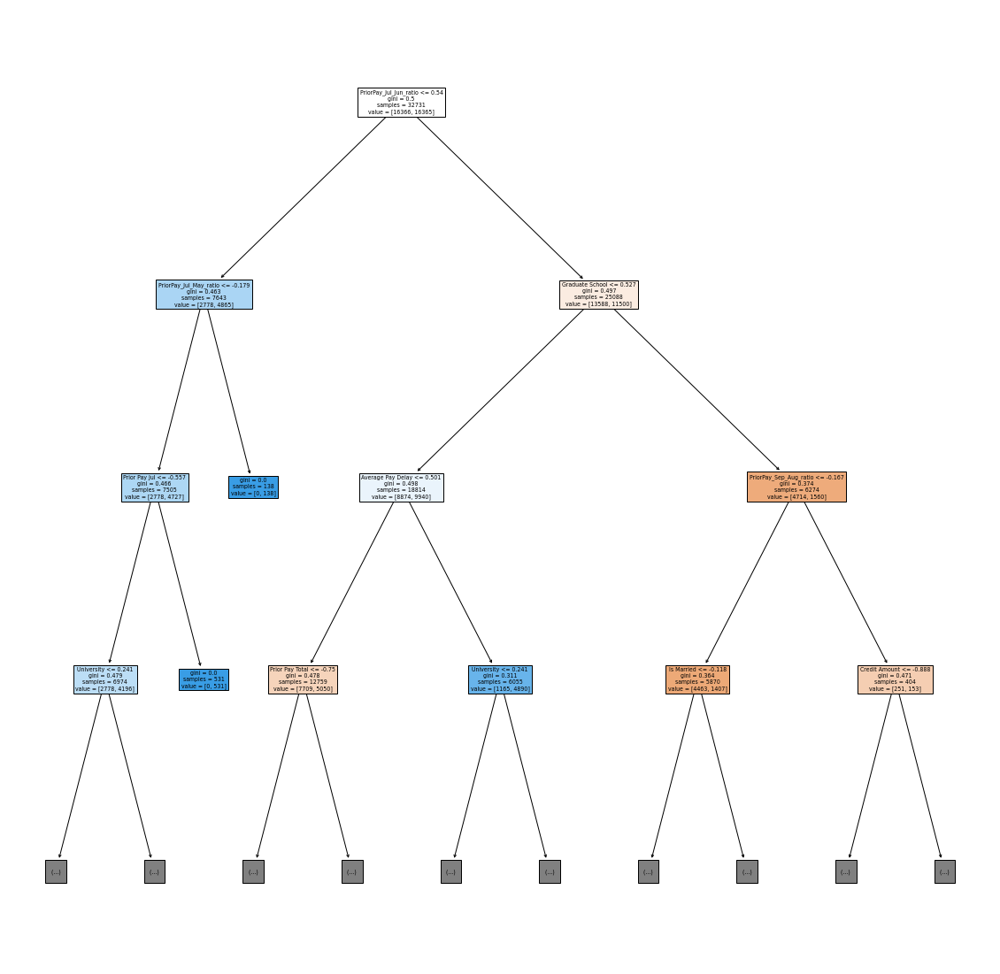

In [55]:
# Plot the random forest
from sklearn.tree import plot_tree

plt.figure(figsize=(20,20))
_ = plot_tree(model['model'].estimators_[0], feature_names=X_train.columns, filled=True, max_depth=3)

In [56]:
# Print the tree depth
print(f"Tree Depth: {model['model'].estimators_[0].tree_.max_depth}")

Tree Depth: 6


In [57]:
# Merge the test data with the root data on their indexes to get the Is Male and Age in Years columns
df_fair = df_smote.copy()

<AxesSubplot:title={'center':'Normalized Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

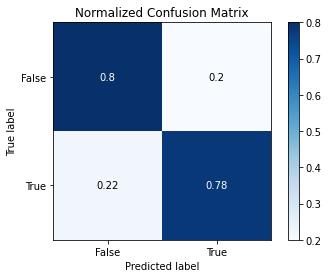

In [58]:
# Filter down to just male rows
df_fair_male = df_fair[df_fair['Is Male'] == True]

X_male = df_fair_male.drop(columns=['Defaulted', 'Is Male', 'Age', 'Stratify', 'Age Group'])
y_male = df_fair_male['Defaulted']

y_pred_male = model.predict(X_male)

skplt.metrics.plot_confusion_matrix(y_male, y_pred_male, normalize=True)

<AxesSubplot:title={'center':'Normalized Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

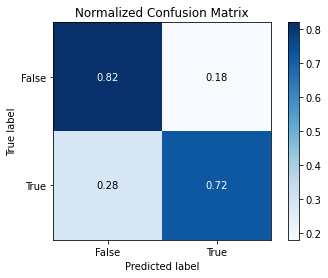

In [59]:
# Filter down to just male rows
df_fair_nonmale = df_fair[df_fair['Is Male'] == False]

X_nonmale = df_fair_nonmale.drop(columns=['Defaulted', 'Is Male', 'Age', 'Stratify', 'Age Group'])
y_nonmale = df_fair_nonmale['Defaulted']

y_pred_nonmale = model.predict(X_nonmale)

skplt.metrics.plot_confusion_matrix(y_nonmale, y_pred_nonmale, normalize=True)

In [60]:
# Add a column for each age value indicating the prediction the model generates
df_fair_predicted = df_fair.copy()
df_fair_predicted['Prediction'] = model.predict(df_fair.drop(columns=['Defaulted', 'Is Male', 'Age', 'Stratify', 'Age Group']))
df_fair_predicted['Is Correct'] = df_fair_predicted['Prediction'].eq(df_fair['Defaulted'])
df_fair_predicted.head()

,Credit Amount,Is Male,Age,Repay Delay Sep,Prior Pay Sep,Prior Pay Aug,Prior Pay Jul,Prior Pay Jun,Prior Pay May,Prior Pay Apr,...,Prior Pay Total,Total Pay Delay,Average Pay Delay,Bill Total,Balance Total,Defaulted,Age Group,Stratify,Prediction,Is Correct
0,20000,False,24,2,0,689,0,0,0,0,...,689,-2,-0.333333,7704,7015,True,2,Defaulted_True_Male_False_Age_2,True,True
1,120000,False,26,-1,0,1000,1000,1000,0,2000,...,5000,3,0.500000,17077,12077,True,2,Defaulted_True_Male_False_Age_2,True,True
2,90000,False,34,0,1518,1500,1000,1000,1000,5000,...,11018,0,0.000000,101653,90635,False,3,Defaulted_False_Male_False_Age_3,False,True
3,50000,False,37,0,2000,2019,1200,1100,1069,1000,...,8388,0,0.000000,231334,222946,False,3,Defaulted_False_Male_False_Age_3,False,True
4,50000,True,57,-1,2000,36681,10000,9000,689,679,...,59049,-2,-0.333333,109339,50290,False,5,Defaulted_False_Male_True_Age_5,False,True


In [61]:
df_age_accuracy = pd.DataFrame(df_fair_predicted.groupby('Age').mean()['Is Correct'])
df_age_accuracy.reset_index(inplace=True)
df_age_accuracy.head()

,Age,Is Correct
0,21,0.753425
1,22,0.725589
2,23,0.773617
3,24,0.763736
4,25,0.777413


In [62]:
# Plot a line graph of the accuracy by age
fig = px.line(df_age_accuracy, x='Age', y='Is Correct', title='Accuracy by Age', labels={'Is Correct': 'Accuracy'})
fig.update_layout(showlegend=False, height=500)
fig.update_yaxes(tickformat=".0%", range=[0, 1])
fig.update_xaxes(range=[0, 100])

# Add a vertical marker at 21
fig.add_vline(x=21, line_width=3, line_dash="dash", line_color="lightgray")
fig.add_vline(x=55, line_width=3, line_dash="dash", line_color="lightgray")

fig.show()

In [63]:
# Plot a histogram of ages with plotly express
fig = px.histogram(df_fair_predicted, x='Age', title='Age Distribution')
fig.update_layout(showlegend=False, height=500)
fig.update_xaxes(range=[0, 100])
fig.show()

In [64]:
df_fair_predicted['Age'].describe()

count    40914.000000
mean        35.368896
std          8.757957
min         21.000000
25%         28.000000
50%         34.000000
75%         41.000000
max         79.000000
Name: Age, dtype: float64